In [ ]:
# Import data (stored in google drive)
from google.colab import drive
drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive


In [ ]:
# Select Checkpoint
!pip install ipywidgets==7.7.1 --quiet

from IPython.display import display
import ipywidgets as widgets
import shutil

ckpt_dic = {
    "Original (higher quality)": "prs-eth/marigold-v1-0",
    "LCM (faster)": "prs-eth/marigold-lcm-v1-0",
}

ckpt_name = 'LCM (faster)'
ckpt_path = ckpt_dic[ckpt_name]
w = widgets.Dropdown(
    options=['Original (higher quality)', 'LCM (faster)'],
    value=ckpt_name,
    description='Checkpoint:',
)


def on_change(change):
    if change['type'] == 'change' and change['name'] == 'value':
        ckpt_name = change['new']
        ckpt_path = ckpt_dic[ckpt_name]

w.observe(on_change)

display(w)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 16.8 MB/s eta 0:00:00


Dropdown(description='Checkpoint:', index=1, options=('Original (higher quality)', 'LCM (faster)'), value='LCM…

In [ ]:
# Clone Marigold repository -- notify Erich about pulling Marigold model
%%shell
cd /content

if [ -d "Marigold" ]; then
    cd Marigold
    git pull
else
    git clone https://github.com/prs-eth/Marigold.git
    cd Marigold
fi


Cloning into 'Marigold'...
remote: Enumerating objects: 472, done.
remote: Counting objects: 100% (321/321), done.
remote: Compressing objects: 100% (182/182), done.
remote: Total 472 (delta 204), reused 224 (delta 133), pack-reused 151
Receiving objects: 100% (472/472), 5.66 MiB | 27.98 MiB/s, done.
Resolving deltas: 100% (267/267), done.


In [ ]:
# Install dependencies from Marigold
%%shell

cd /content/Marigold

# pip install -r requirements.txt --upgrade  --quiet
pip install accelerate diffusers matplotlib scipy torch transformers --quiet

# for progress bar
pip install ipywidgets==7.7.1 --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.4/302.4 kB 5.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 16.0 MB/s eta 0:00:00


In [ ]:
# Setup directories
import os

# Directories
repo_dir = "/content/Marigold"
input_dir = os.path.join("/content/drive/MyDrive/sample", "Image")
output_dir = os.path.join(repo_dir, "outputs")
output_dir_color = os.path.join(output_dir, "depth_colored")
output_dir_tif = os.path.join(output_dir, "depth_bw")
output_dir_npy = os.path.join(output_dir, "depth_npy")

os.chdir(repo_dir)

In [ ]:
import os
import numpy as np
from glob import glob
from collections import deque
from PIL import Image
import torch
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
import logging
from scipy.ndimage import zoom
from sklearn.metrics import mean_squared_error

In [ ]:
def calculate_rmse(predictions, ground_truth):
    """
    Calculate RMSE, resizing the prediction to the ground truth dimensions if necessary.
    """
    if predictions.shape != ground_truth.shape:
        predictions = resize_depth_map(predictions, ground_truth.shape)
    # print("Prediction: ", predictions[0:6])
    # print("Ground truth: " + ground_truth[0:6])
    # return np.sqrt(np.mean((predictions - ground_truth) ** 2))

    rms = mean_squared_error(ground_truth, predictions, squared=False)
    return rms

In [ ]:
def resize_depth_map(source, target_shape):
    """
    Resizes the source array to the target shape using simple resampling,
    which is suitable for depth maps where preserving exact pixel values isn't crucial.
    """
    # Calculate the zoom factors for each dimension
    zoom_factors = (target_shape[0] / source.shape[0], target_shape[1] / source.shape[1])
    return zoom(source, zoom_factors, order=1)  # Using bilinear interpolation (order=1)

In [ ]:
def average_depth_maps(buffer):
    if len(buffer) > 0:
        return np.mean(np.array(buffer), axis=0)
    else:
        return None

In [ ]:
def weighted_average_depth_maps(depth_maps, weights):
    """Calculate the weighted average of depth maps."""
    if len(depth_maps) != len(weights):
        raise ValueError("The number of depth maps and weights must match")
    # Stack the depth maps along the third dimension
    stacked_depth_maps = np.stack(depth_maps, axis=-1)
    # Normalize weights to ensure they sum to 1
    normalized_weights = np.array(weights) / np.sum(weights)
    # Perform the weighted average along the stack
    weighted_avg_depth_map = np.average(stacked_depth_maps, axis=-1, weights=normalized_weights)

    return weighted_avg_depth_map

In [ ]:
def optimize_weights(depth_maps, depth_gt, initial_weights=None, epochs=100, learning_rate=0.01):
    depth_maps_tensor = torch.stack([dm.clone().detach() for dm in depth_maps])
    depth_gt_tensor = depth_gt.clone().detach()

    # Initialize weights or use provided initial weights
    if initial_weights is None:
        weights = torch.randn(depth_maps_tensor.shape[0], requires_grad=True)
    else:
        weights = torch.tensor(initial_weights, dtype=torch.float32, requires_grad=True)

    optimizer = torch.optim.Adam([weights], lr=learning_rate)

    for epoch in range(epochs):
        optimizer.zero_grad()

        # Calculate weighted average of depth maps
        expanded_weights = weights.unsqueeze(1).unsqueeze(2)
        weighted_depth_maps = torch.mul(expanded_weights, depth_maps_tensor)
        weighted_average = torch.sum(weighted_depth_maps, dim=0) / torch.sum(weights)

        # Compute loss
        loss = torch.mean((weighted_average - depth_gt_tensor) ** 2)

        weighted_depth_maps.requires_grad = True
        weighted_average.requires_grad = True
        loss.requires_grad = True

        # Backpropagate the loss
        loss.backward()

        # Update weights
        optimizer.step()

    # Normalize weights to ensure they sum to 1
    with torch.no_grad():
        normalized_weights = weights / weights.sum()

    return normalized_weights.cpu().numpy()

In [ ]:
# Initialize directories and pipeline for Marigold
from marigold import MarigoldPipeline
repo_dir = "/content/Marigold"
ckpt_path = "prs-eth/marigold-lcm-v1-0"
pipe = MarigoldPipeline.from_pretrained(ckpt_path).to("cuda")

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/420 [00:00<?, ?B/s]

Fetching 12 files:   0%|          | 0/12 [00:00<?, ?it/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/824 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/633 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/568 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.85k [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/611 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

In [ ]:
import os
import random
import re
from sklearn.model_selection import train_test_split

In [ ]:
# Define base directory for training data
base_dir = "/content/drive/MyDrive/data"
# Process each dataset
datasets = sorted(glob(os.path.join(base_dir, "sample_*")))
# Define lists to store paths for each set
train_paths = []
val_paths = []
test_paths = []

In [ ]:
def numerical_sort_key(s):
    """
    Extracts numbers from a filename and returns them for sorting purposes.
    """
    return [int(text) if text.isdigit() else text for text in re.split('(\d+)', s)]

In [ ]:
def split_data(files, test_size, val_size):
    """
    Manually splits the data into training, validation, and test sets without shuffling.
    """
    n = len(files)
    test_count = int(n * test_size)
    val_count = int(n * val_size)

    test_files = files[:test_count]
    val_files = files[test_count:test_count + val_count]
    train_files = files[test_count + val_count:]

    return train_files, val_files, test_files

In [ ]:
# Iterate over each video folder
for video_folder in os.listdir(base_dir):
    # Skip directories that do not contain 'sample_'
    if "sample_" not in video_folder:
        continue
    video_path = os.path.join(base_dir, video_folder)
    if not os.path.isdir(video_path):
        continue

    # Gather paths to input images and depth maps
    image_dir = os.path.join(video_path, "Image")
    depth_dir = os.path.join(video_path, "Depth")

    # Sorting files numerically
    image_files = sorted(os.listdir(image_dir), key=numerical_sort_key)
    depth_files = sorted(os.listdir(depth_dir), key=numerical_sort_key)
    assert len(image_files) == len(depth_files), f"Mismatch in number of files for {video_folder}"

    # Split paths into training, validation, and test sets without shuffling
    image_train, image_val, image_test = split_data(image_files, test_size=0.15, val_size=0.1765)
    depth_train, depth_val, depth_test = split_data(depth_files, test_size=0.15, val_size=0.1765)

    # Store paths for each set
    train_paths.extend([(os.path.join(image_dir, img), os.path.join(depth_dir, depth)) for img, depth in zip(image_train, depth_train)])
    val_paths.extend([(os.path.join(image_dir, img), os.path.join(depth_dir, depth)) for img, depth in zip(image_val, depth_val)])
    test_paths.extend([(os.path.join(image_dir, img), os.path.join(depth_dir, depth)) for img, depth in zip(image_test, depth_test)])


In [ ]:
# Print the number of samples in each set
print(f"Number of samples in training set: {len(train_paths)}")
print(f"Number of samples in validation set: {len(val_paths)}")
print(f"Number of samples in test set: {len(test_paths)}")

In [ ]:
import matplotlib.pyplot as plt
from IPython.display import display, clear_output
import pickle

In [ ]:
def extract_video_id(filepath):
    # Regex finds 'sample_' followed by any digits (\d+), capturing the digits only
    match = re.search(r'sample_(\d+)', filepath)
    if match:
        return match.group(1)  # Returns the first group (the digits following 'sample_')
    return None  # Return None if no match is found


In [ ]:
# Training
fig, ax = plt.subplots(figsize=(10, 5))

train_errors = []
val_errors = []
test_errors = []
errors = []
datasets = [train_paths[:400], val_paths[:80], test_paths[:80]]   # Assuming these are already defined
dataset_names = ["Training", "Validation", "Testing"]
current_video_id = None
optimized_weights = [1,1,1,1,1,1,1,1,1,1]
weights_history = []  # To store weights for each iteration

for dataset, name in zip(datasets, dataset_names):
    # Create a new figure and axis object for each dataset
    fig, ax = plt.subplots(figsize=(10, 5))

    print(f"Processing {name} dataset")
    rgb_files = [path[0] for path in dataset]
    depth_gt_files = [path[1] for path in dataset]

    depth_buffer = deque(maxlen=5)
    depth_gt_buffer = deque(maxlen=5)

    if name == "Training":
        errors = train_errors
    elif name == "Validation":
        errors = val_errors
    elif name == "Testing":
        errors = test_errors

    for rgb_path, depth_gt_path in tqdm(zip(rgb_files, depth_gt_files), total=len(rgb_files), desc=f"Processing {name} images"):
        new_video_id = extract_video_id(rgb_path)

        # Check if the video ID has changed (new video sequence)
        if current_video_id is not None and new_video_id != current_video_id:
            # Flush the buffers when a new video sequence is detected
            depth_buffer.clear()
            depth_gt_buffer.clear()

        current_video_id = new_video_id

        with torch.no_grad():
            input_image = Image.open(rgb_path).convert("RGB")
            depth_gt_image = Image.open(depth_gt_path).convert("RGB")

            depth_gt_array = np.array(depth_gt_image)
            depth_gt_decoded = depth_gt_array.mean(axis=2).astype(np.float32) / 255.0
            depth_gt_resized = Image.fromarray(depth_gt_decoded).resize(input_image.size, Image.BILINEAR)
            depth_gt_final = np.array(depth_gt_resized)

            # Call depth estimation pipeline
            pipeline_output = pipe(
                input_image,
                denoising_steps=4,
                ensemble_size=5,
                processing_res=768,
                match_input_res=True,
                color_map="Spectral",
                show_progress_bar=True
            )
            depth_pred = pipeline_output.depth_np

            depth_buffer.append(depth_pred)
            depth_gt_buffer.append(depth_gt_final)

            if len(depth_buffer) > 0:
                depth_maps_tensor = torch.stack([torch.tensor(dm, dtype=torch.float32) for dm in depth_buffer])
                depth_gt_tensor = torch.tensor(depth_gt_final, dtype=torch.float32)

                if name != "Testing":
                    if len(optimized_weights) != len(depth_buffer):
                      optimized_weights = optimize_weights(depth_maps_tensor, depth_gt_tensor)
                    else:
                      optimized_weights = optimize_weights(depth_maps_tensor, depth_gt_tensor, initial_weights=optimized_weights)
                depth_maps_array = np.array(list(depth_buffer))
                if optimized_weights is None or len(optimized_weights) != len(depth_buffer):
                    # Initialize or reset weights if they don't match the current buffer size
                    current_weights = np.ones(len(depth_buffer)) / len(depth_buffer)
                else:
                    # Ensure optimized_weights is a numpy array with the correct length
                    current_weights = optimized_weights[:len(depth_buffer)]

                # Compute the weighted average
                weighted_depth_pred = np.average(depth_maps_array, axis=0, weights=current_weights)
                rmse = calculate_rmse(weighted_depth_pred, depth_gt_final)
                errors.append(rmse)
                print(f'RMSE for {name}: {rmse}')


                weights_history.append(optimized_weights.copy())  # Store a copy of weights for each iteration

                # Save errors and weights_history to a file for every new image processed
                with open(f"{name.lower()}_errors_and_weights.pkl", "wb") as f:
                    pickle.dump({"errors": errors, "weights_history": weights_history}, f)


        # Update the plot for every iteration
        ax.plot(errors, label=f'RMSE per Image for {name} if not ax.lines else "Update')
        ax.set_xlabel('Image Index')
        ax.set_ylabel('RMSE')
        ax.set_title(f'Running RMSE Across {name} Dataset')
        if not ax.lines:
            ax.legend()

        clear_output(wait=True)
        display(fig)
        print("Current Weights", optimized_weights)

    # Save the graph as a PDF before changing from training to validation to testing
    plt.savefig(f"{name.lower()}_graph.pdf")

    plt.close(fig)
    print(optimized_weights)

    print(f"Average RMSE for {name} dataset:", np.mean(errors))

In [ ]:
# Obtain each video data for testing
import os
import re
from glob import glob
base_dir = "/content/drive/MyDrive/data"

# Create a dictionary to store paths for each dataset
dataset_paths = {}
# Iterate over each video folder
for video_folder in os.listdir(base_dir):
    # Skip directories that do not contain 'sample_'
    if "sample_" not in video_folder:
        continue
    video_path = os.path.join(base_dir, video_folder)
    if not os.path.isdir(video_path):
        continue

    # Gather paths to input images and depth maps
    image_dir = os.path.join(video_path, "Image")
    depth_dir = os.path.join(video_path, "Depth")
    # print(image_dir, depth_dir)

    # Ensure directories exist
    if not os.path.exists(image_dir) or not os.path.exists(depth_dir):
        continue

    # Sorting files numerically
    image_files = sorted(os.listdir(image_dir), key=numerical_sort_key)
    depth_files = sorted(os.listdir(depth_dir), key=numerical_sort_key)
    assert len(image_files) == len(depth_files), f"Mismatch in number of files for {video_folder}"

    # Store paths for each image-depth pair in the dictionary
    dataset_paths[video_folder] = [(os.path.join(image_dir, img), os.path.join(depth_dir, depth)) for img, depth in zip(image_files, depth_files)]

In [ ]:
print(dataset_paths)

{'sample_2': [('/content/drive/MyDrive/data/sample_2/Image/Image_0_0_0001_0.png', '/content/drive/MyDrive/data/sample_2/Depth/Depth_0_0_0001_0.png'), ('/content/drive/MyDrive/data/sample_2/Image/Image_0_0_0002_0.png', '/content/drive/MyDrive/data/sample_2/Depth/Depth_0_0_0002_0.png'), ('/content/drive/MyDrive/data/sample_2/Image/Image_0_0_0003_0.png', '/content/drive/MyDrive/data/sample_2/Depth/Depth_0_0_0003_0.png'), ('/content/drive/MyDrive/data/sample_2/Image/Image_0_0_0004_0.png', '/content/drive/MyDrive/data/sample_2/Depth/Depth_0_0_0004_0.png'), ('/content/drive/MyDrive/data/sample_2/Image/Image_0_0_0005_0.png', '/content/drive/MyDrive/data/sample_2/Depth/Depth_0_0_0005_0.png'), ('/content/drive/MyDrive/data/sample_2/Image/Image_0_0_0006_0.png', '/content/drive/MyDrive/data/sample_2/Depth/Depth_0_0_0006_0.png'), ('/content/drive/MyDrive/data/sample_2/Image/Image_0_0_0007_0.png', '/content/drive/MyDrive/data/sample_2/Depth/Depth_0_0_0007_0.png'), ('/content/drive/MyDrive/data/samp

In [ ]:
def plot_errors(errors, title):
    fig, ax = plt.subplots(figsize=(10, 5))
    ax.plot(errors, label='RMSE per Image')
    ax.set_xlabel('Image Index')
    ax.set_ylabel('RMSE')
    ax.set_title(title)
    ax.legend()
    plt.show()
    plt.close(fig)

In [ ]:
def process_video_optimized(rgb_depth_pairs):
    depth_buffer = deque(maxlen=5)
    errors = []
    frame_buffer = deque(maxlen=5)
    original_weights = np.array([0.2854117, 0.04321782, -0.33442682, 0.27889505, 0.7269023])

    for rgb_path, depth_gt_path in tqdm(rgb_depth_pairs, desc="Processing images"):
        with torch.no_grad():
            input_image = Image.open(rgb_path).convert("RGB")
            input_array = np.array(input_image, dtype=np.float32)
            frame_buffer.append(input_array)

            # Determine the weights based on the buffer size
            if len(frame_buffer) == frame_buffer.maxlen:
                normalized_weights = original_weights / np.sum(original_weights)
            else:
                # Use only the most recent weights corresponding to the number of frames available
                recent_weights = original_weights[-len(frame_buffer):]
                normalized_weights = recent_weights / np.sum(recent_weights)

            # Compute the weighted average of images
            blended_image_array = np.average(np.stack(frame_buffer, axis=0), axis=0, weights=normalized_weights)
            blended_image = Image.fromarray(np.uint8(blended_image_array))

            depth_gt_image = Image.open(depth_gt_path).convert("RGB")
            depth_gt_array = np.array(depth_gt_image)
            depth_gt_decoded = depth_gt_array.mean(axis=2).astype(np.float32) / 255.0
            depth_gt_resized = Image.fromarray(depth_gt_decoded).resize(blended_image.size, Image.BILINEAR)
            depth_gt_final = np.array(depth_gt_resized)

            # Call your depth estimation pipeline on the blended image
            pipeline_output = pipe(
                blended_image,
                denoising_steps=4,
                ensemble_size=5,
                processing_res=768,
                match_input_res=True,
                color_map="Spectral",
                show_progress_bar=True
            )
            depth_pred = pipeline_output.depth_np

            depth_buffer.append(depth_pred)

            # RMSE on the latest depth map only
            rmse = calculate_rmse(depth_pred, depth_gt_final)
            errors.append(rmse)
            print(f'RMSE: {rmse}')

    return np.mean(errors), errors

In [ ]:
def process_video_exponential_decay(rgb_depth_pairs):
    depth_buffer = deque(maxlen=5)
    errors = []
    frame_buffer = deque(maxlen=5)
    lambda_decay = 0.8

    for rgb_path, depth_gt_path in tqdm(rgb_depth_pairs, desc="Processing images"):
        with torch.no_grad():
              input_image = Image.open(rgb_path).convert("RGB")
              input_array = np.array(input_image, dtype=np.float32)
              frame_buffer.append(input_array)

              # Calculate weights based on buffer size
              weights = np.array([lambda_decay**i for i in range(len(frame_buffer)-1, -1, -1)])
              normalized_weights = weights / np.sum(weights)

              # Compute weighted average of images
              blended_image_array = np.average(np.stack(frame_buffer, axis=0), axis=0, weights=normalized_weights)
              blended_image = Image.fromarray(np.uint8(blended_image_array))

              depth_gt_image = Image.open(depth_gt_path).convert("RGB")
              depth_gt_array = np.array(depth_gt_image)
              depth_gt_decoded = depth_gt_array.mean(axis=2).astype(np.float32) / 255.0
              depth_gt_resized = Image.fromarray(depth_gt_decoded).resize(blended_image.size, Image.BILINEAR)
              depth_gt_final = np.array(depth_gt_resized)

              # Call your depth estimation pipeline on the blended image
              pipeline_output = pipe(
                  blended_image,
                  denoising_steps=4,
                  ensemble_size=5,
                  processing_res=768,
                  match_input_res=True,
                  color_map="Spectral",
                  show_progress_bar=True
              )
              depth_pred = pipeline_output.depth_np

              depth_buffer.append(depth_pred)

              # RMSE on the latest depth map only
              rmse = calculate_rmse(depth_pred, depth_gt_final)
              errors.append(rmse)
              print(f'RMSE: {rmse}')

    return np.mean(errors), errors

In [ ]:
def process_video_average(rgb_depth_pairs):
    depth_buffer = deque(maxlen=5)
    errors = []
    frame_buffer = deque(maxlen=5)

    for rgb_path, depth_gt_path in tqdm(rgb_depth_pairs, desc="Processing images"):
        with torch.no_grad():
            input_image = Image.open(rgb_path).convert("RGB")
            input_array = np.array(input_image, dtype=np.float32)
            frame_buffer.append(input_array)

            # Calculate equal weights for all images in the buffer
            if len(frame_buffer) > 0:
                normalized_weights = np.ones(len(frame_buffer)) / len(frame_buffer)
            else:
                normalized_weights = np.array([])

            # Compute average of images
            blended_image_array = np.average(np.stack(frame_buffer, axis=0), axis=0, weights=normalized_weights)
            blended_image = Image.fromarray(np.uint8(blended_image_array))

            depth_gt_image = Image.open(depth_gt_path).convert("RGB")
            depth_gt_array = np.array(depth_gt_image)
            depth_gt_decoded = depth_gt_array.mean(axis=2).astype(np.float32) / 255.0
            depth_gt_resized = Image.fromarray(depth_gt_decoded).resize(blended_image.size, Image.BILINEAR)
            depth_gt_final = np.array(depth_gt_resized)

            # Call your depth estimation pipeline on the blended image
            pipeline_output = pipe(
                blended_image,
                denoising_steps=4,
                ensemble_size=5,
                processing_res=768,
                match_input_res=True,
                color_map="Spectral",
                show_progress_bar=True
            )
            depth_pred = pipeline_output.depth_np

            depth_buffer.append(depth_pred)

            # RMSE on the latest depth map only
            rmse = calculate_rmse(depth_pred, depth_gt_final)
            errors.append(rmse)
            print(f'RMSE: {rmse}')
    return np.mean(errors), errors

In [ ]:
def process_video_baseline(rgb_depth_pairs):
    errors = []
    for rgb_path, depth_gt_path in tqdm(rgb_depth_pairs, desc="Processing images"):
        with torch.no_grad():
            input_image = Image.open(rgb_path).convert("RGB")
            depth_gt_image = Image.open(depth_gt_path).convert("RGB")
            depth_gt_array = np.array(depth_gt_image)
            depth_gt_decoded = depth_gt_array.mean(axis=2).astype(np.float32) / 255.0
            depth_gt_resized = Image.fromarray(depth_gt_decoded).resize(input_image.size, Image.BILINEAR)
            depth_gt_final = np.array(depth_gt_resized)

            # Call your depth estimation pipeline
            pipeline_output = pipe(
                    input_image,
                    denoising_steps=4,
                    ensemble_size=5,
                    processing_res=768,
                    match_input_res=True,
                    color_map="Spectral",
                    show_progress_bar=True
            )
            depth_pred = pipeline_output.depth_np

            rmse = calculate_rmse(depth_pred, depth_gt_final)
            errors.append(rmse)
            print(f'RMSE: {rmse}')
    return np.mean(errors), errors

Processing images:   0%|          | 0/192 [00:00<?, ?it/s]

  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3688974976539612


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3696790635585785


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.30891892313957214


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3370359539985657


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3471433222293854


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35215288400650024


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.36464470624923706


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.34880855679512024


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35053035616874695


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3452123999595642


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3568252623081207


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.36253851652145386


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.34088268876075745


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3533279001712799


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3418910503387451


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.34139424562454224


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3383154273033142


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3410361707210541


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3406148850917816


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.34724608063697815


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.34121420979499817


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3329564034938812


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3344652056694031


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.34158119559288025


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35925009846687317


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.34997138381004333


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3469689190387726


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35890525579452515


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3458760380744934


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3694595694541931


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.34926220774650574


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.33072629570961


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.32984253764152527


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.33561787009239197


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.327242910861969


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3426101505756378


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35631802678108215


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.32928138971328735


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3392808437347412


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3456210494041443


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3471912741661072


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3163412809371948


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.347390353679657


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3520073890686035


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3373871445655823


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.33291488885879517


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3316885530948639


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3332667648792267


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3363141119480133


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.34884604811668396


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.32949933409690857


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.33335548639297485


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.337367981672287


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.34817808866500854


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3367784917354584


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.34140288829803467


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3064012825489044


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3150612711906433


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3364855647087097


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.36096376180648804


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3249388337135315


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.33809953927993774


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3200680911540985


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.32962900400161743


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.34908875823020935


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35629019141197205


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.32989317178726196


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.31921762228012085


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3662859797477722


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35948580503463745


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.34200868010520935


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.361782968044281


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3584097921848297


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3209798038005829


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3353259563446045


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3558472692966461


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3364846706390381


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.33627843856811523


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3404545187950134


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.33428433537483215


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3482719361782074


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.33259549736976624


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3495238125324249


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.32796481251716614


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.32184138894081116


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3424157202243805


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.30606746673583984


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.33499738574028015


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35114020109176636


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3419511318206787


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.34279537200927734


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3582226634025574


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35658174753189087


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35632652044296265


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3575502038002014


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3714856505393982


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3787103295326233


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3672313094139099


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.38060396909713745


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3684382438659668


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.37170159816741943


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3603748083114624


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.38376984000205994


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.39186474680900574


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.39653316140174866


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3555002808570862


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.36392441391944885


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3929472863674164


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.4000997543334961


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.36761388182640076


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3696356415748596


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3676629066467285


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3866809606552124


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3782193064689636


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3946400284767151


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3989216089248657


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3931567668914795


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3193396031856537


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.31896525621414185


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3122342526912689


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3352746367454529


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3412068486213684


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.32017192244529724


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3261058032512665


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35920849442481995


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3352139890193939


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35467714071273804


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35102367401123047


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35870838165283203


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3471708297729492


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3138555586338043


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.37811216711997986


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3215388357639313


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.27517038583755493


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.29882511496543884


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.37974467873573303


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3703896999359131


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3694664239883423


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3633243441581726


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.38582366704940796


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3699581027030945


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3556836247444153


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.34261465072631836


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3545754551887512


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3850844204425812


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35658225417137146


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35987406969070435


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35459715127944946


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.356803834438324


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35828468203544617


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3541645407676697


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.34124112129211426


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.34271201491355896


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35094407200813293


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.33952781558036804


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3108251094818115


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.28060704469680786


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.31416282057762146


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3145729899406433


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.321530282497406


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.32024869322776794


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.36066871881484985


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3638698160648346


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3603336215019226


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3613259792327881


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.37154191732406616


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3685503304004669


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.354649156332016


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3492618203163147


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.33703842759132385


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3442566990852356


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3435400128364563


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3546186089515686


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3525935411453247


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.34453004598617554


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3270283639431


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3416261076927185


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.33456188440322876


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3256593346595764


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3394733667373657


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.36554986238479614


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3722389340400696


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3507927358150482


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.38698458671569824


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3904199004173279


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3868411183357239


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.39175865054130554


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.4146353602409363


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.38493359088897705


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.2843393087387085


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.2855721116065979


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.2825493812561035


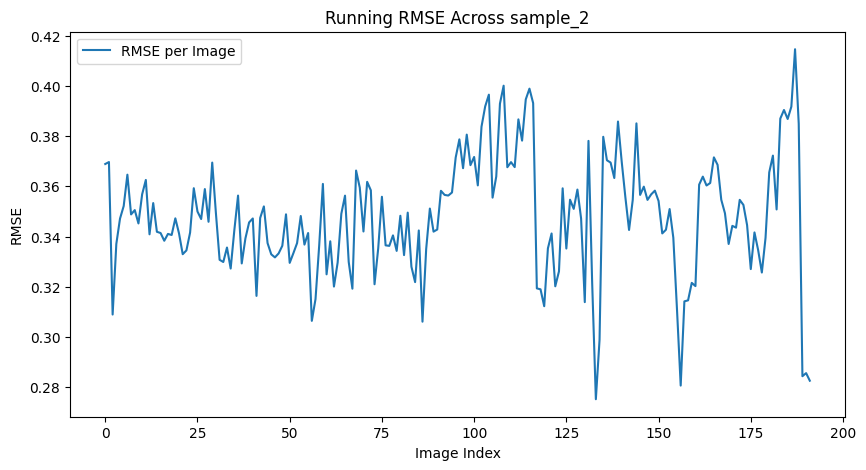

Average RMSE for sample_2: 0.34784945845603943


In [ ]:
keys = list(dataset_paths.keys())
current_key = keys[0]

# Process only the second video
mean_rmse, errors = process_video_optimized(dataset_paths[current_key])
plot_errors(errors, f'Running RMSE Across {current_key}')
print(f"Average RMSE for {current_key}: {mean_rmse}")

In [ ]:
print(f"RMSE for {current_key}: {errors}")
print(current_key)

RMSE for sample_2: [0.3688975, 0.36967906, 0.30891892, 0.33703595, 0.34714332, 0.35215288, 0.3646447, 0.34880856, 0.35053036, 0.3452124, 0.35682526, 0.36253852, 0.3408827, 0.3533279, 0.34189105, 0.34139425, 0.33831543, 0.34103617, 0.34061489, 0.34724608, 0.3412142, 0.3329564, 0.3344652, 0.3415812, 0.3592501, 0.34997138, 0.34696892, 0.35890526, 0.34587604, 0.36945957, 0.3492622, 0.3307263, 0.32984254, 0.33561787, 0.3272429, 0.34261015, 0.35631803, 0.3292814, 0.33928084, 0.34562105, 0.34719127, 0.31634128, 0.34739035, 0.3520074, 0.33738714, 0.3329149, 0.33168855, 0.33326676, 0.3363141, 0.34884605, 0.32949933, 0.3333555, 0.33736798, 0.3481781, 0.3367785, 0.3414029, 0.30640128, 0.31506127, 0.33648556, 0.36096376, 0.32493883, 0.33809954, 0.3200681, 0.329629, 0.34908876, 0.3562902, 0.32989317, 0.31921762, 0.36628598, 0.3594858, 0.34200868, 0.36178297, 0.3584098, 0.3209798, 0.33532596, 0.35584727, 0.33648467, 0.33627844, 0.34045452, 0.33428434, 0.34827194, 0.3325955, 0.3495238, 0.3279648, 0.3

Processing images:   0%|          | 0/192 [00:00<?, ?it/s]

  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.37633568048477173


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3674006760120392


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.37558513879776


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.37047654390335083


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3632186949253082


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.37097281217575073


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35682862997055054


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3647661805152893


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.36804646253585815


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.359487920999527


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3540409207344055


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3601338863372803


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.34770527482032776


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35543835163116455


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3495505452156067


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3432156443595886


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3454088568687439


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35107001662254333


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3514196276664734


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35417795181274414


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35982662439346313


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3610549569129944


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35624057054519653


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3434058725833893


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3721492886543274


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3688448667526245


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3663647472858429


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3529927730560303


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3525359034538269


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35806378722190857


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3610464930534363


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3606111407279968


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3624451458454132


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3564545512199402


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3493328094482422


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.34327489137649536


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3464803695678711


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3570198118686676


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3334532678127289


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3435513973236084


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.338347852230072


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.34554338455200195


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3464639186859131


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.360424280166626


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3589724898338318


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.37231987714767456


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3740919232368469


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3492754101753235


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3581177294254303


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.36068016290664673


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35750025510787964


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3657754063606262


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35585278272628784


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.36098799109458923


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3645889163017273


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.36142832040786743


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.34967344999313354


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35386648774147034


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.36086657643318176


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3610761761665344


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3546210825443268


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35812538862228394


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35027164220809937


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3685137629508972


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.36163243651390076


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.368293434381485


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.36417198181152344


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3658908009529114


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3568184971809387


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.36375442147254944


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.37469449639320374


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3718712329864502


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3842495381832123


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3675140142440796


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3543895184993744


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3571494221687317


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3541938364505768


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35362961888313293


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.36622491478919983


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35445767641067505


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3608216643333435


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.34599241614341736


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3480665683746338


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3534771800041199


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.34868961572647095


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3560146689414978


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35695314407348633


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35566428303718567


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35098427534103394


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35616421699523926


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.36595630645751953


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3645378053188324


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.36215776205062866


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3709793984889984


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3716762959957123


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.36664828658103943


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3831169605255127


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3865424394607544


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3891053795814514


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3823308050632477


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3849073350429535


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.36306488513946533


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3827536106109619


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3794724941253662


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3799705505371094


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.37468406558036804


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3928815722465515


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3549031615257263


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.37828439474105835


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.38545531034469604


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.37382370233535767


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.38074153661727905


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3788883090019226


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3751360774040222


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3844245374202728


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3862375319004059


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.39533406496047974


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.32674238085746765


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3208741843700409


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3241652548313141


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.32853350043296814


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3220185339450836


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.31564807891845703


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.32269349694252014


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.32851487398147583


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.32715269923210144


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.31973737478256226


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.32276108860969543


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.33834919333457947


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.33983927965164185


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.22568054497241974


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3350737988948822


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.25319766998291016


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.22970828413963318


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.22952762246131897


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.33992645144462585


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3410360813140869


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3522331118583679


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3466320037841797


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3568652272224426


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3538055419921875


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.33809760212898254


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.33747825026512146


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3410259485244751


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.33800992369651794


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3218892216682434


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3329486846923828


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3391103148460388


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.32073158025741577


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.339567095041275


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.31615281105041504


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.34153836965560913


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.31167760491371155


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.33595454692840576


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3453517258167267


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.29654860496520996


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.30818313360214233


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.29558509588241577


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.28859755396842957


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.30144375562667847


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.30538439750671387


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.34790799021720886


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3644557595252991


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3619765639305115


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3643839955329895


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.36532509326934814


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3481619954109192


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3627452850341797


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.356085866689682


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3531169295310974


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35587963461875916


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3516397178173065


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35190504789352417


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.34147900342941284


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.34105801582336426


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3435162901878357


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3477148115634918


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35942384600639343


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.37772494554519653


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.36008787155151367


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.36482423543930054


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3635764420032501


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3555574417114258


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.34818994998931885


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35266369581222534


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.36184102296829224


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3568210005760193


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3796176016330719


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3745368719100952


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.26828715205192566


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.2847641408443451


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.30317315459251404


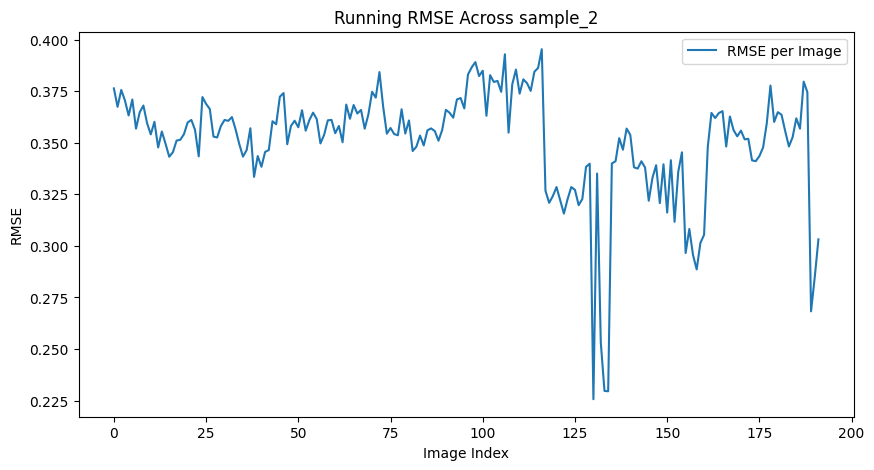

Average RMSE for sample_2: 0.3507709503173828
RMSE for sample_2: [0.37633568, 0.36740068, 0.37558514, 0.37047654, 0.3632187, 0.3709728, 0.35682863, 0.36476618, 0.36804646, 0.35948792, 0.35404092, 0.3601339, 0.34770527, 0.35543835, 0.34955055, 0.34321564, 0.34540886, 0.35107002, 0.35141963, 0.35417795, 0.35982662, 0.36105496, 0.35624057, 0.34340587, 0.3721493, 0.36884487, 0.36636475, 0.35299277, 0.3525359, 0.3580638, 0.3610465, 0.36061114, 0.36244515, 0.35645455, 0.3493328, 0.3432749, 0.34648037, 0.3570198, 0.33345327, 0.3435514, 0.33834785, 0.34554338, 0.34646392, 0.36042428, 0.3589725, 0.37231988, 0.37409192, 0.3492754, 0.35811773, 0.36068016, 0.35750026, 0.3657754, 0.35585278, 0.360988, 0.36458892, 0.36142832, 0.34967345, 0.3538665, 0.36086658, 0.36107618, 0.35462108, 0.3581254, 0.35027164, 0.36851376, 0.36163244, 0.36829343, 0.36417198, 0.3658908, 0.3568185, 0.36375442, 0.3746945, 0.37187123, 0.38424954, 0.367514, 0.35438952, 0.35714942, 0.35419384, 0.35362962, 0.3662249, 0.35445768

In [ ]:
keys = list(dataset_paths.keys())
current_key = keys[0]


mean_rmse_base_1, errors_base_1 = process_video_baseline(dataset_paths[current_key])
plot_errors(errors_base_1, f'Running RMSE Across {current_key}')
print(f"Average RMSE for {current_key}: {mean_rmse_base_1}")
print(f"RMSE for {current_key}: {errors_base_1}")

In [ ]:
print(f"Average RMSE for {current_key}: {mean_rmse_base_1}")
print(f"RMSE for {current_key}: {errors_base_1}")

Average RMSE for sample_2: 0.3507709503173828
RMSE for sample_2: [0.37633568, 0.36740068, 0.37558514, 0.37047654, 0.3632187, 0.3709728, 0.35682863, 0.36476618, 0.36804646, 0.35948792, 0.35404092, 0.3601339, 0.34770527, 0.35543835, 0.34955055, 0.34321564, 0.34540886, 0.35107002, 0.35141963, 0.35417795, 0.35982662, 0.36105496, 0.35624057, 0.34340587, 0.3721493, 0.36884487, 0.36636475, 0.35299277, 0.3525359, 0.3580638, 0.3610465, 0.36061114, 0.36244515, 0.35645455, 0.3493328, 0.3432749, 0.34648037, 0.3570198, 0.33345327, 0.3435514, 0.33834785, 0.34554338, 0.34646392, 0.36042428, 0.3589725, 0.37231988, 0.37409192, 0.3492754, 0.35811773, 0.36068016, 0.35750026, 0.3657754, 0.35585278, 0.360988, 0.36458892, 0.36142832, 0.34967345, 0.3538665, 0.36086658, 0.36107618, 0.35462108, 0.3581254, 0.35027164, 0.36851376, 0.36163244, 0.36829343, 0.36417198, 0.3658908, 0.3568185, 0.36375442, 0.3746945, 0.37187123, 0.38424954, 0.367514, 0.35438952, 0.35714942, 0.35419384, 0.35362962, 0.3662249, 0.35445768

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.34725937247276306


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35875096917152405


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35807016491889954


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3508389890193939


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35041946172714233


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.35073739290237427


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.36317458748817444


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.36682945489883423


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.36455562710762024


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.37213334441185


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.38149920105934143


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.37527719140052795


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.37754708528518677


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3607874810695648


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.38825640082359314


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.30171656608581543


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.32071739435195923


  Inference batches:   0%|          | 0/3 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

    Diffusion denoising:   0%|          | 0/4 [00:00<?, ?it/s]

RMSE: 0.3163771629333496


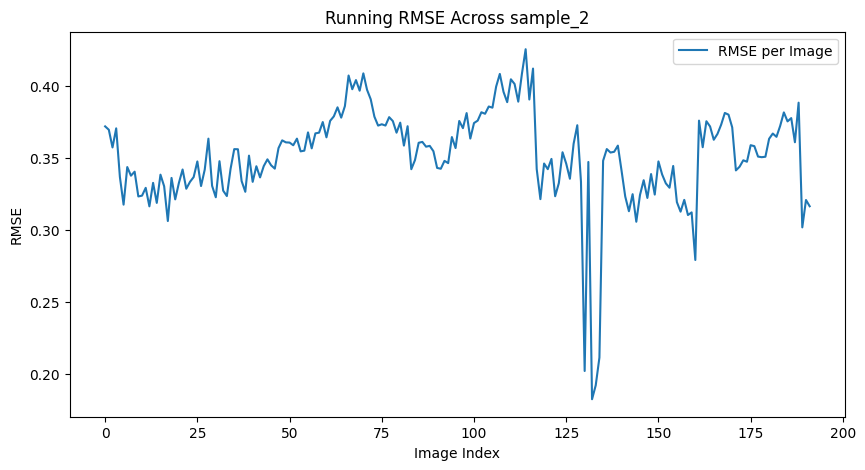

Average RMSE for sample_2: 0.35143694281578064
RMSE for sample_2: [0.3718051, 0.36945376, 0.35718518, 0.37042922, 0.33674303, 0.31749415, 0.3435774, 0.3375884, 0.34037656, 0.32318053, 0.3237164, 0.32915014, 0.31629294, 0.33259448, 0.31871527, 0.33830255, 0.33024663, 0.3061188, 0.33603165, 0.32113835, 0.33259, 0.34188372, 0.32852465, 0.333275, 0.33662286, 0.34748054, 0.33038887, 0.3417572, 0.36328936, 0.33053675, 0.32260904, 0.34764352, 0.3272071, 0.32345167, 0.34224933, 0.3560137, 0.35592914, 0.33385733, 0.32640618, 0.35149732, 0.3332979, 0.34413534, 0.33639675, 0.34423184, 0.34893098, 0.34478942, 0.34247506, 0.35669732, 0.36210787, 0.36070842, 0.360567, 0.3587021, 0.36329517, 0.35447273, 0.3549556, 0.3676334, 0.35654277, 0.36694682, 0.36743933, 0.37481344, 0.36420503, 0.37563714, 0.37874565, 0.3850217, 0.37787315, 0.38586158, 0.4071067, 0.3975978, 0.40393335, 0.39656788, 0.40859628, 0.39721388, 0.39061818, 0.37854335, 0.37235996, 0.37326935, 0.37238222, 0.37820727, 0.37546462, 0.36743

In [ ]:
keys = list(dataset_paths.keys())
current_key = keys[0]


mean_rmse_base_2, errors_base_2 = process_video_exponential_decay(dataset_paths[current_key])
plot_errors(errors_base_2, f'Running RMSE Across {current_key}')
print(f"Average RMSE for {current_key}: {mean_rmse_base_2}")
print(f"RMSE for {current_key}: {errors_base_2}")

In [ ]:
print(f"Average RMSE for {current_key}: {mean_rmse_base_2}")
print(f"RMSE for {current_key}: {errors_base_2}")

In [ ]:
keys = list(dataset_paths.keys())
current_key = 'sample_2'


mean_rmse_base_3, errors_base_3 = process_video_average(dataset_paths[current_key])
plot_errors(errors_base_3, f'Running RMSE Across {current_key}')
print(f"Average RMSE for {current_key}: {mean_rmse_base_3}")
print(f"RMSE for {current_key}: {errors_base_3}")

In [ ]:
# Test on data with weights as trained
depth_buffer = deque(maxlen=5)
frame_buffer = deque(maxlen=5)
errors = []
fig, ax = plt.subplots(figsize=(10, 5))
original_weights = np.array([0.2854117, 0.04321782, -0.33442682, 0.27889505, 0.7269023])

for rgb_path, depth_gt_path in tqdm(dataset, total=len(dataset), desc="Processing images"):
    with torch.no_grad():
        input_image = Image.open(rgb_path).convert("RGB")
        input_array = np.array(input_image, dtype=np.float32)
        frame_buffer.append(input_array)

        # Determine the weights based on the buffer size
        if len(frame_buffer) == frame_buffer.maxlen:
            normalized_weights = original_weights / np.sum(original_weights)
        else:
            # Use only the most recent weights corresponding to the number of frames available
            recent_weights = original_weights[-len(frame_buffer):]
            normalized_weights = recent_weights / np.sum(recent_weights)

        # Compute the weighted average of images
        blended_image_array = np.average(np.stack(frame_buffer, axis=0), axis=0, weights=normalized_weights)
        blended_image = Image.fromarray(np.uint8(blended_image_array))

        depth_gt_image = Image.open(depth_gt_path).convert("RGB")
        depth_gt_array = np.array(depth_gt_image)
        depth_gt_decoded = depth_gt_array.mean(axis=2).astype(np.float32) / 255.0
        depth_gt_resized = Image.fromarray(depth_gt_decoded).resize(blended_image.size, Image.BILINEAR)
        depth_gt_final = np.array(depth_gt_resized)

        # Call your depth estimation pipeline on the blended image
        pipeline_output = pipe(
            blended_image,
            denoising_steps=4,
            ensemble_size=5,
            processing_res=768,
            match_input_res=True,
            color_map="Spectral",
            show_progress_bar=True
        )
        depth_pred = pipeline_output.depth_np

        depth_buffer.append(depth_pred)

        # RMSE on the latest depth map only
        rmse = calculate_rmse(depth_pred, depth_gt_final)
        errors.append(rmse)
        print(f'RMSE: {rmse}')

# Finalize plot
ax.plot(errors, label='RMSE per Image')
ax.set_xlabel('Image Index')
ax.set_ylabel('RMSE')
ax.set_title('Running RMSE Across Dataset')
ax.legend()
plt.show()
plt.savefig("dataset_rmse_graph.pdf")
plt.close(fig)

print(f"Average RMSE for the dataset: {np.mean(errors)}")

In [ ]:
# Test on data with exponentially decaying weights
depth_buffer = deque(maxlen=5)
frame_buffer = deque(maxlen=5)
errors = []

fig, ax = plt.subplots(figsize=(10, 5))

# Lambda for exponential decay
lambda_decay = 0.8

for rgb_path, depth_gt_path in tqdm(dataset, total=len(dataset), desc="Processing images"):
    with torch.no_grad():
        input_image = Image.open(rgb_path).convert("RGB")
        input_array = np.array(input_image, dtype=np.float32)
        frame_buffer.append(input_array)

        # Calculate weights based on buffer size
        weights = np.array([lambda_decay**i for i in range(len(frame_buffer)-1, -1, -1)])
        normalized_weights = weights / np.sum(weights)

        # Compute weighted average of images
        blended_image_array = np.average(np.stack(frame_buffer, axis=0), axis=0, weights=normalized_weights)
        blended_image = Image.fromarray(np.uint8(blended_image_array))

        depth_gt_image = Image.open(depth_gt_path).convert("RGB")
        depth_gt_array = np.array(depth_gt_image)
        depth_gt_decoded = depth_gt_array.mean(axis=2).astype(np.float32) / 255.0
        depth_gt_resized = Image.fromarray(depth_gt_decoded).resize(blended_image.size, Image.BILINEAR)
        depth_gt_final = np.array(depth_gt_resized)

        # Call your depth estimation pipeline on the blended image
        pipeline_output = pipe(
            blended_image,
            denoising_steps=4,
            ensemble_size=5,
            processing_res=768,
            match_input_res=True,
            color_map="Spectral",
            show_progress_bar=True
        )
        depth_pred = pipeline_output.depth_np

        depth_buffer.append(depth_pred)

        # RMSE on the latest depth map only
        rmse = calculate_rmse(depth_pred, depth_gt_final)
        errors.append(rmse)
        print(f'RMSE: {rmse}')

# Finalize plot
ax.plot(errors, label='RMSE per Image')
ax.set_xlabel('Image Index')
ax.set_ylabel('RMSE')
ax.set_title('Running RMSE Across Dataset')
ax.legend()
plt.show()
plt.savefig("dataset_rmse_graph.pdf")
plt.close(fig)

print(f"Average RMSE for the dataset: {np.mean(errors)}")

In [ ]:
# Test on data with equal weights throughout (just average)
depth_buffer = deque(maxlen=5)
frame_buffer = deque(maxlen=5)
errors = []

fig, ax = plt.subplots(figsize=(10, 5))

for rgb_path, depth_gt_path in tqdm(dataset, total=len(dataset), desc="Processing images"):
    with torch.no_grad():
        input_image = Image.open(rgb_path).convert("RGB")
        input_array = np.array(input_image, dtype=np.float32)
        frame_buffer.append(input_array)

        # Calculate equal weights for all images in the buffer
        if len(frame_buffer) > 0:
            normalized_weights = np.ones(len(frame_buffer)) / len(frame_buffer)
        else:
            normalized_weights = np.array([])

        # Compute average of images
        blended_image_array = np.average(np.stack(frame_buffer, axis=0), axis=0, weights=normalized_weights)
        blended_image = Image.fromarray(np.uint8(blended_image_array))

        depth_gt_image = Image.open(depth_gt_path).convert("RGB")
        depth_gt_array = np.array(depth_gt_image)
        depth_gt_decoded = depth_gt_array.mean(axis=2).astype(np.float32) / 255.0
        depth_gt_resized = Image.fromarray(depth_gt_decoded).resize(blended_image.size, Image.BILINEAR)
        depth_gt_final = np.array(depth_gt_resized)

        # Call your depth estimation pipeline on the blended image
        pipeline_output = pipe(
            blended_image,
            denoising_steps=4,
            ensemble_size=5,
            processing_res=768,
            match_input_res=True,
            color_map="Spectral",
            show_progress_bar=True
        )
        depth_pred = pipeline_output.depth_np

        depth_buffer.append(depth_pred)

        # RMSE on the latest depth map only
        rmse = calculate_rmse(depth_pred, depth_gt_final)
        errors.append(rmse)
        print(f'RMSE: {rmse}')

# Finalize plot
ax.plot(errors, label='RMSE per Image')
ax.set_xlabel('Image Index')
ax.set_ylabel('RMSE')
ax.set_title('Running RMSE Across Dataset')
ax.legend()
plt.show()
plt.savefig("dataset_rmse_graph.pdf")
plt.close(fig)

print(f"Average RMSE for the dataset: {np.mean(errors)}")

In [ ]:
# Test on data without any conditional inputs (baseline)
errors = []

fig, ax = plt.subplots(figsize=(10, 5))

for rgb_path, depth_gt_path in tqdm(dataset, total=len(dataset), desc="Processing images"):
    with torch.no_grad():
        input_image = Image.open(rgb_path).convert("RGB")
        depth_gt_image = Image.open(depth_gt_path).convert("RGB")
        depth_gt_array = np.array(depth_gt_image)
        depth_gt_decoded = depth_gt_array.mean(axis=2).astype(np.float32) / 255.0
        depth_gt_resized = Image.fromarray(depth_gt_decoded).resize(input_image.size, Image.BILINEAR)
        depth_gt_final = np.array(depth_gt_resized)

        # Call your depth estimation pipeline
        pipeline_output = pipe(
                input_image,
                denoising_steps=4,
                ensemble_size=5,
                processing_res=768,
                match_input_res=True,
                color_map="Spectral",
                show_progress_bar=True
        )
        depth_pred = pipeline_output.depth_np

        rmse = calculate_rmse(depth_pred, depth_gt_final)
        errors.append(rmse)
        print(f'RMSE: {rmse}')

# Finalize plot
ax.plot(errors, label='RMSE per Image')
ax.set_xlabel('Image Index')
ax.set_ylabel('RMSE')
ax.set_title('Running RMSE Across Dataset')
ax.legend()
plt.show()
plt.savefig("dataset_rmse_graph.pdf")
plt.close(fig)

print(f"Average RMSE for the dataset: {np.mean(errors)}")